In [1]:
using StatsBase
using Distributions
using ProgressBars
using Plots

default(margin=6Plots.mm) # plot parameters

In [2]:
# Input parameters

const BURN_IN_GEN_N = 100
const TOTAL_GEN_N = 125

# Max coordinates of the population bounding space
# (population = disk)
const X_MAX_BURN_IN = 10
const X_MAX = 50
const Y_MAX = 20

 # (population reaches space bounds)
const X_START = X_MAX_BURN_IN
const Y_START = Y_MAX
# (population starts out twice smaller)
#const X_START = trunc(X_MAX/2)
#const Y_START = trunc(Y_MAX/2)

# Dimensions of the whole space
const X_DIM = X_MAX
const Y_DIM = Y_MAX

# Population parameters
#const INIT_PERSON_N = 30
const DEMES_FULL_AT_START = 5
const K_CAPACITY = 100
const R_PROLIF_RATE = 2
const r_LOG_PROLIF_RATE = log(2)

# Gene parameters
const LOCI_N = 1000
const REGIONS_N = 20
const MUT_RATE = 0.1 # genome-wide
const M_MIG_RATE = 0.1
const S_SELECT_COEF = 0.01
const H_DOMIN_COEF = 0
const MUT_DELETER_RATE = 0.9 # only for theory


build_next_gen (generic function with 1 method)

In [ ]:

x_range = 1:Int(X_START)
y_range = 1:Int(Y_START)
possible_init_coords = [collect(x) for x in Iterators.product(x_range, y_range)]
init_coords = sample(possible_init_coords,DEMES_FULL_AT_START;replace=false)

world = Array{Array{Array{Float32}}}(undef,X_DIM,Y_DIM)

for coord in init_coords
    if !isassigned(world,coord...)
        world[coord...] = []
    end
    for i in 1:K_CAPACITY
        push!(world[coord...],zeros(LOCI_N*2))
    end
end

@inbounds function multi_fitn_in_person(person,count_muts=false)
    new_fitness = 1.0
    muts_AA = 0
    muts_Aa = 0
    for j in 1:LOCI_N
        if person[j]==1 && person[j+LOCI_N]==1
            new_fitness *= 1 - S_SELECT_COEF
            if count_muts
                muts_AA += 1
            end
            
        elseif person[j]==1 || person[j+LOCI_N]==1
            new_fitness *= 1 - H_DOMIN_COEF * S_SELECT_COEF
            if count_muts
                muts_Aa += 1
            end
        end
    end
    if count_muts
        muts_aa =  LOCI_N-muts_AA-muts_Aa
        return new_fitness,muts_AA,muts_Aa,muts_aa
    else
        return new_fitness
    end
end

@inbounds function mean_max_fitn_and_muts(fitness_array)
    smth = map(x->x[1],fitness_array)
    meanfit = mean(smth)
    maxfit = maximum(smth)
    muts1 = mean(map(x->x[2],fitness_array))
    muts2 = mean(map(x->x[3],fitness_array))
    muts3 = mean(map(x->x[4],fitness_array))
    return meanfit,maxfit,muts1,muts2,muts3
end

@inbounds function mutate(person)
    get_mutation_random = rand(Poisson(MUT_RATE))
    @fastmath @inbounds for _ in 1:get_mutation_random
        pos_alter = sample(1:LOCI_N*2)
        person[pos_alter] = 1
    end
end

@inbounds function recombine(person)
    for i in 1:REGIONS_N
        lr = rand(1:2)
        loci_per_region = round(Int32,LOCI_N/REGIONS_N)
        for j in (1 + (i-1)*loci_per_region):(i*loci_per_region)
            person[j] = lr==1 ? person[j] : person[j+LOCI_N]
        end
    end
end

@inbounds function mate_cond(mom_fit,dad_fit,max_fitness)
    return (mom_fit > rand()*max_fitness) & (dad_fit > rand()*max_fitness)
end

@inbounds function mate(person1,person2)
    new_loci = vcat(person1[1:LOCI_N],person2[1:LOCI_N])
    #muts_AA...
    return new_loci
end

@inbounds function build_next_gen(wld,x_max_migrate)
    # Function 1
    next_gen_pops = zeros(Int16,X_DIM,Y_DIM)
    next_gen_posits = []
    fill!(next_gen_pops,-1)
    for x in 1:X_DIM,y in 1:Y_DIM
        if isassigned(world,x,y) && length(world[x,y])>0
            n_ppl_at_deme = length(world[x,y])
            expected_offspring = n_ppl_at_deme * (R_PROLIF_RATE/(1 + (n_ppl_at_deme*(R_PROLIF_RATE-1))/K_CAPACITY))
            next_gen_pops[x,y] =  rand(Poisson(expected_offspring))
            if next_gen_pops[x,y]>0
                push!(next_gen_posits,[x,y])
            end
        end
    end
    

    # Function 2
    #wld_next = Array{Person}(undef,sum(next_gen_pops))
    wld_next = Array{Array{Array{Float32}}}(undef,X_DIM,Y_DIM)
    
    all_birth_count = 0

    # Function 3
    mean_fitn_wld = Array{Float32}(undef,X_DIM,Y_DIM)
    fill!(mean_fitn_wld,-1)
    #pops_wld = zeros(Int32,X_DIM,Y_DIM)
    muts_AA_wld = zeros(Float32,X_DIM,Y_DIM)
    muts_Aa_wld = zeros(Float32,X_DIM,Y_DIM)
    muts_aa_wld = zeros(Float32,X_DIM,Y_DIM)

    for deme in next_gen_posits
        curr_persons_at_pos = wld[deme...]
        hehe = multi_fitn_in_person.(curr_persons_at_pos,true)
        mean_fitn_wld[deme...],max_fitness,muts_AA_wld[deme...],muts_Aa_wld[deme...],muts_aa_wld[deme...] = mean_max_fitn_and_muts(hehe)

        next_generation_size = next_gen_pops[deme...]
        
        if next_generation_size > 0
            birth_count = 0
            while birth_count < next_generation_size
                mom = curr_persons_at_pos[rand(1:end)]
                dad = curr_persons_at_pos[rand(1:end)]
                mom_fit = multi_fitn_in_person(mom)
                dad_fit = multi_fitn_in_person(dad)




                #print(mate_cond(relative_extract_xx_ind,relative_extract_xy_ind,max_fitness))
                if mate_cond(mom_fit,dad_fit,max_fitness)
                    #println(mom)
                    gamete_mom = copy(mom) # technically a person, but we'll only use the first half of loci
                    gamete_dad = copy(dad) # technically a person, but we'll only use the first half of loci
                    recombine(gamete_mom)
                    recombine(gamete_dad)
                    mutate(gamete_mom)
                    mutate(gamete_dad)
                    mate_result = mate(gamete_mom,gamete_dad)

                    move_x = 0
                    move_y = 0
                    if rand()<M_MIG_RATE
                        dir = sample([[-1,-1],[-1,0],[-1,1],[0,-1],[0,1],[1,-1],[1,0],[1,1]])
                        move_x = dir[1]
                        move_y = dir[2]
                        if deme[1]+move_x > x_max_migrate || deme[1]+move_x < 1
                            #move_x = 0
                            move_x = -move_x
                        end
                        if deme[2]+move_y > Y_MAX || deme[2]+move_y < 1
                            #move_y = 0
                            move_y = -move_y
                        end
                    end

                    if !isassigned(wld_next,deme[1]+move_x,deme[2]+move_y)
                        wld_next[deme[1]+move_x,deme[2]+move_y] = []
                    end
                    push!(wld_next[deme[1]+move_x,deme[2]+move_y],mate_result)

                    birth_count += 1
                    all_birth_count += 1
                end
            end
            #pops_wld[deme...] = birth_count
        end
    end
    return wld_next,mean_fitn_wld,muts_AA_wld,muts_Aa_wld,muts_aa_wld
end

In [3]:
meanf_world = Array{Float32}(undef,X_DIM,Y_DIM,0)
#pops_world = Array{Int32}(undef,X_DIM,Y_DIM,0)
muts_AA_world = Array{Float32}(undef,X_DIM,Y_DIM,0)
muts_Aa_world = Array{Float32}(undef,X_DIM,Y_DIM,0)
muts_aa_world = Array{Float32}(undef,X_DIM,Y_DIM,0)

@inbounds for heh in 1:BURN_IN_GEN_N
    global world,meanf,muts1,muts2,muts3 = build_next_gen(world,X_MAX_BURN_IN)
    global meanf_world = cat(meanf_world, meanf, dims=3)
    global muts_AA_world = cat(muts_AA_world, muts1, dims=3)
    global muts_Aa_world = cat(muts_Aa_world, muts2, dims=3)
    global muts_aa_world = cat(muts_aa_world, muts3, dims=3)
    #pops_world = cat(pops_world, pops, dims=3)
end

@inbounds for heh in (BURN_IN_GEN_N+1):TOTAL_GEN_N
    global world,meanf,muts1,muts2,muts3 = build_next_gen(world,X_MAX)
    global meanf_world = cat(meanf_world, meanf, dims=3)
    global muts_AA_world = cat(muts_AA_world, muts1, dims=3)
    global muts_Aa_world = cat(muts_Aa_world, muts2, dims=3)
    global muts_aa_world = cat(muts_aa_world, muts3, dims=3)
    #pops_world = cat(pops_world, pops, dims=3)
end

In [9]:
(muts_AA_world[3,3,120]+muts_Aa_world[3,3,120]+muts_aa_world[3,3,120])

1000.0f0

In [13]:
(muts_AA_world[4,4,80]+muts_Aa_world[4,4,80]+muts_aa_world[4,4,80])

1000.0f0

In [15]:
(muts_AA_world[4,5,110]+muts_Aa_world[4,6,110]+muts_aa_world[4,4,10])

1008.9782f0

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_nYtuJ2h4V4.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\B5j7d\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_nYtuJ2h4V4.gif")
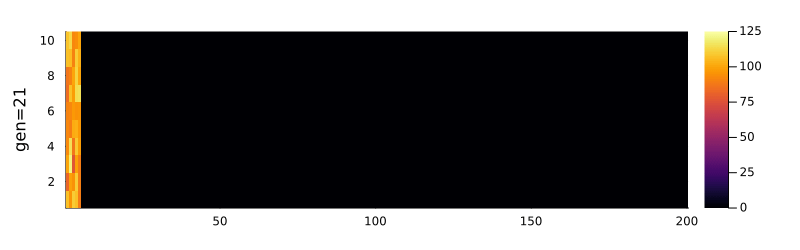

In [4]:
slow_down = 1
gen_start = 20
gen_end = 50

@gif for i=gen_start:(gen_end*slow_down-1)
    gen_no = trunc(Int,i/slow_down)+1
    heatmap(pops_world[:,:,gen_no]',clims=(0,125),ylabel="gen=$gen_no",size=(800,250))
end

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_52xKpyxmhs.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\B5j7d\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_52xKpyxmhs.gif")
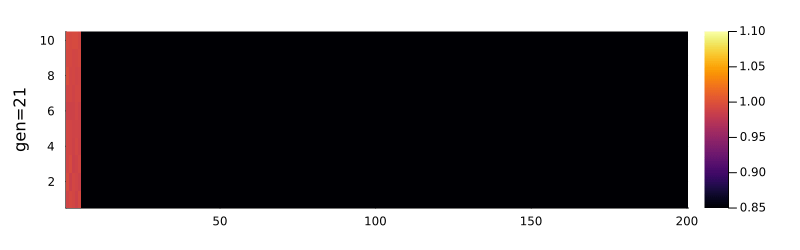

In [5]:
slow_down = 1
gen_start = 20
gen_end = 50

@gif for i=gen_start:(gen_end*slow_down-1)
    gen_no = trunc(Int,i/slow_down)+1
    heatmap(meanf_world[:,:,gen_no]',clims=(0.85,1.1),ylabel="gen=$gen_no",size=(800,250))
end

In [25]:
function get_normalised_matrix(meanfit_array)
    normal_array = copy(meanfit_array)
    for j in 1:(TOTAL_GEN_N-BURN_IN_GEN_N)
        gen_max = maximum(meanfit_array[:,:,BURN_IN_GEN_N+j])
        normal_array[:,:,BURN_IN_GEN_N+j] /= gen_max
        #println(gen_max)
    end
    return normal_array
end

function get_normalised_matrix_offset_mean(meanfit_array)
    normal_array = copy(meanfit_array)
    
    sum = 0
    count = 0
    for u in meanfit_array[:,:,BURN_IN_GEN_N]
        if u > 0
            sum += u
            count += 1
        end
    end
    gen_max = sum/count

    normal_array[:,:,BURN_IN_GEN_N:end] /= gen_max
    return normal_array
end

function meanfit_norm_after_2d(meanfit_array)
    normal_array = copy(meanfit_array)
    for j in (BURN_IN_GEN_N+1):TOTAL_GEN_N
        gen_max = maximum(meanfit_array[:,:,BURN_IN_GEN_N+1])
        normal_array[:,:,j] /= gen_max
        #println(gen_max)
    end
    return normal_array
end

function meanfit_norm_after(meanfit_array)
    normal_array = copy(meanfit_array)
    for j in (BURN_IN_GEN_N+1):TOTAL_GEN_N
        gen_max = maximum(meanfit_array[BURN_IN_GEN_N+1])
        normal_array[j] /= gen_max
        #println(gen_max)
    end
    return normal_array
end

function find_front(meanfit_array,oneside=false)
    front_array = Array{Float64}(undef,0)
    for j in 1:TOTAL_GEN_N
        sum_total = 0
        cnt = 0
        # scanning every y: side 1
        for _y in 1:Y_DIM
            frontier_x = X_DIM
            while frontier_x != 1 && meanfit_array[frontier_x,_y,j] < 0
                frontier_x -= 1
            end
            if meanfit_array[frontier_x,_y,j]>0
                sum_total += meanfit_array[frontier_x,_y,j]
                cnt += 1
            end
        end
        # scanning every y: side 2
        if !oneside
            for _y in 1:Y_DIM
                frontier_x = 1
                while frontier_x != X_DIM && meanfit_array[frontier_x,_y,j] < 0
                    frontier_x += 1
                end
                if meanfit_array[frontier_x,_y,j]>0
                    sum_total += meanfit_array[frontier_x,_y,j]
                    cnt += 1
                end
            end
        end
        mean_both_sides_y = sum_total/cnt

        if !oneside
            sum_total = 0
            cnt = 0
            # scanning every x: side 1
            for _x in 1:X_DIM
                frontier_y = Y_DIM
                while frontier_y != 1 && meanfit_array[_x,frontier_y,j] < 0
                    frontier_y -= 1
                end
                if meanfit_array[_x,frontier_y,j]>0
                    sum_total += meanfit_array[_x,frontier_y,j]
                    cnt += 1
                end
            end
            # scanning every x: side 2
            for _x in 1:X_DIM
                frontier_y = 1
                while frontier_y != Y_DIM && meanfit_array[_x,frontier_y,j] < 0
                    frontier_y += 1
                end
                if meanfit_array[_x,frontier_y,j]>0
                    sum_total += meanfit_array[_x,frontier_y,j]
                    cnt += 1
                end
            end
            mean_both_sides_x = sum_total/cnt
            front_array = cat(front_array,(mean_both_sides_x+mean_both_sides_y)/2, dims=1)
        else
            front_array = cat(front_array,mean_both_sides_y, dims=1)
        end
    end
    return front_array
end

find_front (generic function with 2 methods)

In [26]:
# disk: my procedure
#meanfitness_normal = meanfit_norm_after_2d(meanfitness_matome)
#meanfitness_front = find_front(meanfitness_matome)
#meanfitness_front_normal = meanfit_norm_after(meanfitness_front)

# disk: Peischl's procedure
#meanfitness_normal = get_normalised_matrix(meanfitness_matome)
#meanfitness_front_normal = find_front(meanfitness_normal)
#meanfitness_front = find_front(meanfitness_matome)

# stripe: my procedure
meanfitness_normal = get_normalised_matrix_offset_mean(meanfitness_matome)
meanfitness_front_normal = find_front(meanfitness_normal,true)
meanfitness_front = find_front(meanfitness_matome,true)
meanfitness_front_r = find_front(meanfitness_matome_r,true)

2000-element Vector{Float64}:
 1.0
 0.9996325046904316
 0.9993842519593502
 0.9988321027261335
 0.9989489902549201
 0.99851321375401
 0.9979583638709466
 0.9978362368971244
 0.997721872536417
 0.9966348252124647
 ⋮
 0.8898831622582396
 0.8900785025782414
 0.8889991104095049
 0.8900231983133123
 0.8908409733688927
 0.8918604965502743
 0.890859671333095
 0.89005370985235
 0.8927831415086194

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_KtmJ4xGde7.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\B5j7d\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_KtmJ4xGde7.gif")
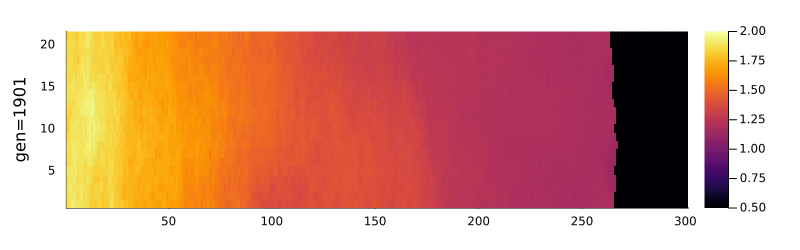

In [21]:
slow_down = 1
gen_start = 1900
gen_end = 2000

@gif for i=gen_start:(gen_end*slow_down-1)
    gen_no = trunc(Int,i/slow_down)+1
    heatmap(meanfitness_matome[:,:,gen_no]',clims=(0.5,2.0),ylabel="gen=$gen_no",size=(800,250))
end

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_OjWTgtizwH.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\B5j7d\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_OjWTgtizwH.gif")
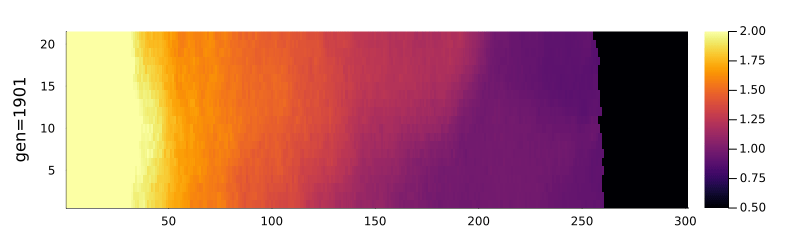

In [22]:
slow_down = 1
gen_start = 1900
gen_end = 2000

@gif for i=gen_start:(gen_end*slow_down-1)
    gen_no = trunc(Int,i/slow_down)+1
    heatmap(meanfitness_matome_r[:,:,gen_no]',clims=(0.5,2.0),ylabel="gen=$gen_no",size=(800,250))
end

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_iZ41YrsJY1.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\B5j7d\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_iZ41YrsJY1.gif")
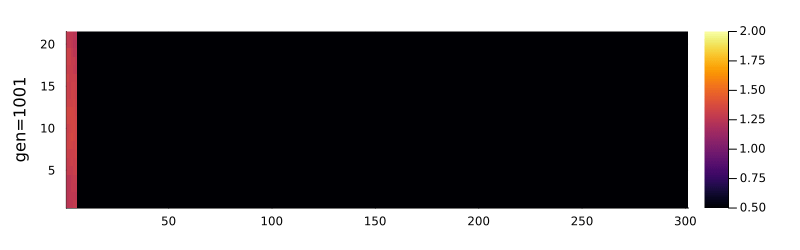

In [23]:
slow_down = 1
gen_start = 1000
gen_end = 1100

@gif for i=gen_start:(gen_end*slow_down-1)
    gen_no = trunc(Int,i/slow_down)+1
    heatmap(meanfitness_matome_r[:,:,gen_no]',clims=(0.5,2.0),ylabel="gen=$gen_no",size=(800,250))
end

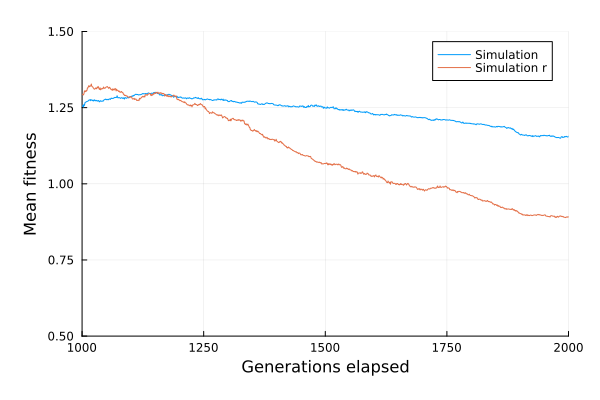

In [27]:
plot(meanfitness_front,label = "Simulation",xlims=(BURN_IN_GEN_N,TOTAL_GEN_N),xlabel="Generations elapsed",ylabel="Mean fitness",ylims=(0.5,1.5))
plot!(meanfitness_front_r,label = "Simulation r",xlims=(BURN_IN_GEN_N,TOTAL_GEN_N),xlabel="Generations elapsed",ylabel="Mean fitness",ylims=(0.5,1.5))

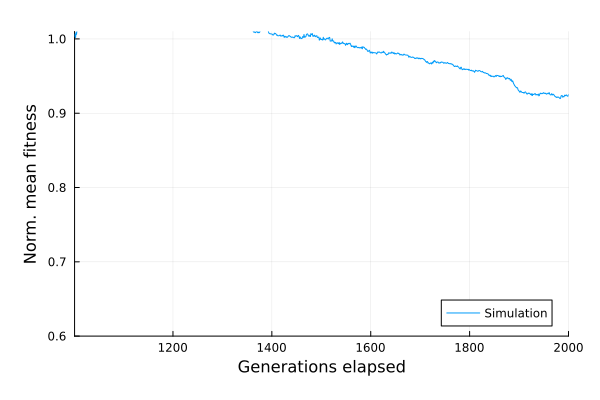

In [28]:
plot(meanfitness_front_normal,label = "Simulation",xlims=(BURN_IN_GEN_N+1,TOTAL_GEN_N),xlabel="Generations elapsed",ylabel="Norm. mean fitness",ylims=(0.6,1.01))